In [5]:
# !unzip "/content/drive/MyDrive/celebrity_project.zip" -d "/content/drive/MyDrive/CelebrityDataset/"

In [6]:
#importing necessary libraries and checking their current versions
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: ",tf.__version__)
print("TF hub version: ",hub.__version__)

#checking for GPU availabilty by changing the runtime type to GPU
print("GPU available: ", "YES!" if tf.config.list_physical_devices("GPU") else "GPU : Not Available")

TF version:  2.12.0
TF hub version:  0.14.0
GPU available:  YES!


In [7]:
import os
import datetime
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.python.ops import image_ops_impl
from keras.layers.attention.multi_head_attention import activation




class CelebFaceDetector:
    def load_celebrity_labels(self, labels_file):
        celeb_labels = pd.read_csv(labels_file)
        self.unique_celeb = np.unique(celeb_labels['id'])
        return celeb_labels

    #putting up together in Keras deep learning model
    #Creating a function for model
    def create_model(self,MODEL_URL,INPUT_SHAPE,OUTPUT_SHAPE):
          print("Building the model with:",MODEL_URL)
          #Setting up model Layers
          model= tf.keras.Sequential([hub.KerasLayer(MODEL_URL),#Input layer # Layer1
                                      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                            activation='softmax') #layer 2 (Output layer)
                                                            ])
          #compiling the model
          model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                        optimizer=tf.keras.optimizers.Adam(),
                        metrics=['accuracy'])
          #build the model
          model.build(INPUT_SHAPE)
          return model


if __name__ == "__main__":
  labels_file = "/content/drive/MyDrive/CelebrityDataset/label.csv"
  test_path = "/content/drive/MyDrive/CelebrityDataset/test/"
  celeb_detector= CelebFaceDetector()
  celeb_labels = celeb_detector.load_celebrity_labels(labels_file)


In [8]:
#preparing our dataset
#conveting our images into Tensors i.e numerical representation
#checking our image data lables

import pandas as pd
celeb_labels = pd.read_csv("/content/drive/MyDrive/CelebrityDataset/label.csv")

In [9]:
#describing our labels
print(celeb_labels.describe())
print()

                                          id              Image
count                                   1360               1360
unique                                  1360                 17
top     82c1f472-0730-4ec7-bf17-c57131c59ef3  leonardo_dicaprio
freq                                       1                 80



In [10]:
celeb_labels.head()

,id,Image
0,82c1f472-0730-4ec7-bf17-c57131c59ef3,leonardo_dicaprio
1,0351cbc6-9560-462f-addc-bfd37ff34ecb,scarlett_johansson
2,d3a7d8a3-7b43-4b6d-8576-9965645906dc,brad_pitt
3,40d8ea31-9dcc-4bf4-8f1d-b4301230751c,sandra_bullock
4,5eb66016-bc4f-45f0-ae8c-20e3ade5d273,leonardo_dicaprio


In [11]:
#checking how many images are there for each celebrity
celeb_labels["Image"].value_counts()

leonardo_dicaprio     80
robert_downey_jr      80
natalie_portman       80
tom_cruise            80
jennifer_lawrence     80
hugh_jackman          80
johnny_depp           80
denzel_washington     80
megan_fox             80
scarlett_johansson    80
tom_hanks             80
angelina_jolie        80
will_smith            80
kate_winslet          80
sandra_bullock        80
brad_pitt             80
nicole_kidman         80
Name: Image, dtype: int64

<Axes: >

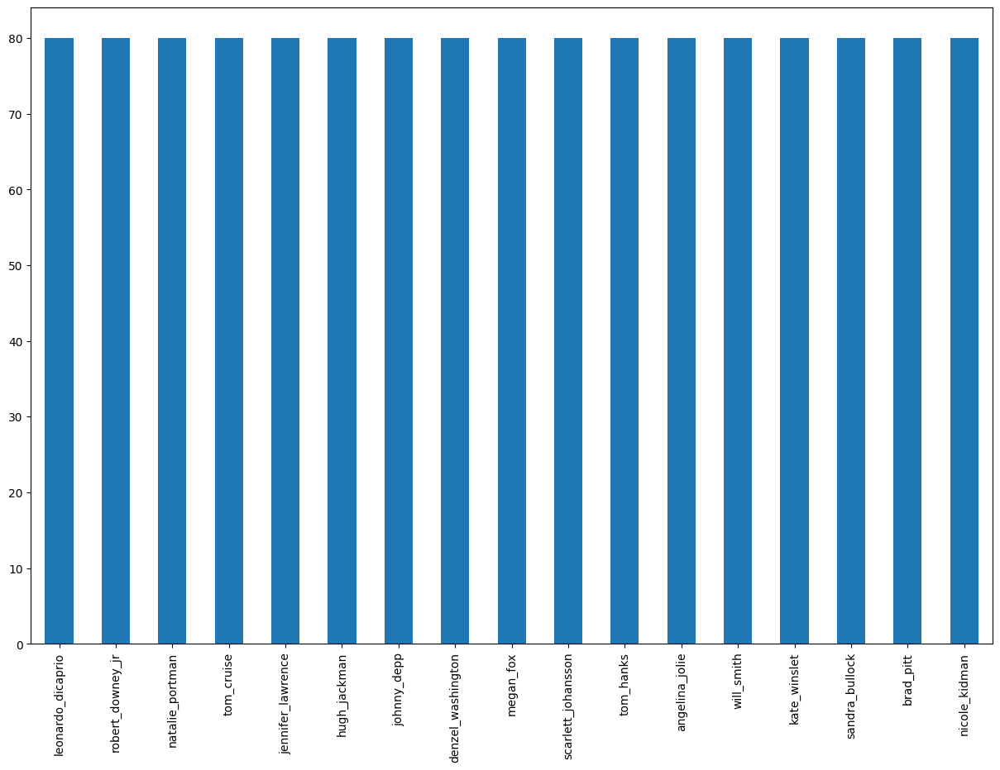

In [12]:
#checking the same in bar plot
celeb_labels["Image"].value_counts().plot.bar(figsize=(15,10))

In [13]:
#checking the median of celeb images
celeb_labels["Image"].value_counts().median()

80.0

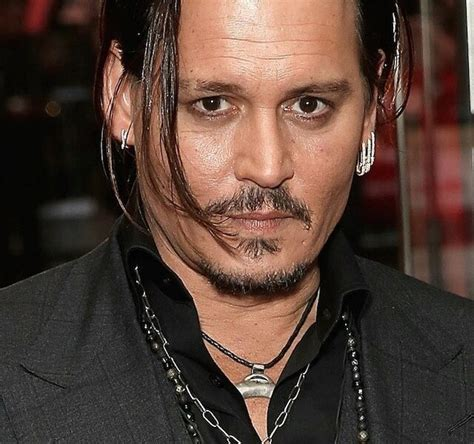

In [14]:
# #viewing the image
from IPython.display import Image
Image("/content/drive/MyDrive/CelebrityDataset/train/01ea1194-2a5b-4c4a-840a-a84190519cca.jpg")






In [15]:
#creating path names
files =["/content/drive/MyDrive/CelebrityDataset/train/" + celeb + ".jpg" for celeb in celeb_labels['id']]
files[:5]

['/content/drive/MyDrive/CelebrityDataset/train/82c1f472-0730-4ec7-bf17-c57131c59ef3.jpg',
 '/content/drive/MyDrive/CelebrityDataset/train/0351cbc6-9560-462f-addc-bfd37ff34ecb.jpg',
 '/content/drive/MyDrive/CelebrityDataset/train/d3a7d8a3-7b43-4b6d-8576-9965645906dc.jpg',
 '/content/drive/MyDrive/CelebrityDataset/train/40d8ea31-9dcc-4bf4-8f1d-b4301230751c.jpg',
 '/content/drive/MyDrive/CelebrityDataset/train/5eb66016-bc4f-45f0-ae8c-20e3ade5d273.jpg']

In [16]:
#checking if number of images in files equals actual images
import os
if len(os.listdir("/content/drive/MyDrive/CelebrityDataset/train/"))==len(files):
  print("Matching")
else:
  print("Not Matching")


Matching


In [17]:
#define image size
IMG_SIZE = 224

def process_image(image_path,img_size):
        #read image
    image = tf.io.read_file(image_path)
      #turning jpg image to into tensor with 3 colour(RGB)
    image=tf.image.decode_jpeg(image,channels=3)
        #converting 0-255 values into 0-1 values
    image=tf.image.convert_image_dtype(image,tf.float32)
        #resize image into 224*224
    image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

    return image



In [18]:
celeb_labels['id'][50]

'8a5f9736-4b23-4c84-8a96-d3dc8dc3bc9f'

In [19]:
#preparing lables
import numpy as np
labels =celeb_labels['Image']
labels = np.array(labels)
labels

array(['leonardo_dicaprio', 'scarlett_johansson', 'brad_pitt', ...,
       'megan_fox', 'sandra_bullock', 'kate_winslet'], dtype=object)

In [20]:
len(labels)

1360

In [21]:
if len(labels)==len(files):
  print("Match")
else:
  print('error')

Match


In [22]:
unique_celeb=np.unique(labels)
len(unique_celeb)

17

In [23]:
#Example
#turning single label into boolean arrays
print(labels[0])
labels[0]==unique_celeb

leonardo_dicaprio


array([False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False])

In [24]:
#Turning all labels into boolean arrays
boolean_labels=[label==unique_celeb for label in labels]
boolean_labels[:3]

[array([False, False, False, False, False, False, False,  True, False,
        False, False, False, False, False, False, False, False]),
 array([False, False, False, False, False, False, False, False, False,
        False, False, False, False,  True, False, False, False]),
 array([False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False])]

In [25]:
#Example
#converting single boolean lables into numbers
print(labels[0]) #original label
print(np.where(unique_celeb==labels[0])) # Index where label occurs
print(boolean_labels[0].argmax()) # Index where label occurs in boolean array
print(boolean_labels[0].astype(int)) #false =0, true=1


leonardo_dicaprio
(array([7]),)
7
[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0]


#Creating our Validation set

In [26]:
#Setting up X and y variables
X= files
y=boolean_labels

In [27]:
len(files)

1360

##Experimenting for ~100 images


In [28]:

NUM_IMAGE=200 #@param {type:"slider", min:50, max:200, step:10}

In [29]:
#Splitting the data into train and validation set
from sklearn.model_selection import train_test_split

X_train,X_val,y_train,y_val =train_test_split(X[:NUM_IMAGE],
                                              y[:NUM_IMAGE],
                                              test_size=0.2,
                                              random_state=42)
len(X_train),len(y_train),len(X_val),len(y_val)

(160, 160, 40, 40)

In [30]:
X_train[:2],y_train[:2]

(['/content/drive/MyDrive/CelebrityDataset/train/71253031-770e-4241-80e1-057f08f433cd.jpg',
  '/content/drive/MyDrive/CelebrityDataset/train/cab94bdc-decb-4b40-9a42-d698fbc4b7b0.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False,  True, False]),
  array([False, False, False, False, False, False, False, False, False,
         False, False,  True, False, False, False, False, False])])

#Turning our images into Tensors
### Creating a function that takes up the image path, use tensorflow to read the file and save it to a variable, convert image into TENSORS, RESIZING our image into (224 X 224) and return the modified image.

In [31]:
#converting into numpy array
from matplotlib.pyplot import imread
image=imread(files[40])
image.shape

(495, 474, 3)

In [32]:
image.max(), image.min()

(255, 0)

In [33]:
image

array([[[ 78,  73,  95],
        [ 78,  73,  95],
        [ 78,  73,  95],
        ...,
        [ 62,  63,  94],
        [ 64,  65,  96],
        [ 64,  65,  96]],

       [[ 78,  73,  95],
        [ 78,  73,  95],
        [ 78,  73,  95],
        ...,
        [ 62,  63,  94],
        [ 63,  64,  95],
        [ 63,  64,  95]],

       [[ 78,  73,  95],
        [ 78,  73,  95],
        [ 78,  73,  95],
        ...,
        [ 62,  63,  94],
        [ 63,  64,  95],
        [ 63,  64,  95]],

       ...,

       [[ 13,  30,  58],
        [  0,  17,  45],
        [  3,  20,  48],
        ...,
        [212, 222, 234],
        [229, 237, 248],
        [227, 236, 245]],

       [[ 37,  54,  82],
        [  8,  25,  53],
        [  5,  22,  50],
        ...,
        [207, 219, 233],
        [215, 225, 237],
        [214, 222, 233]],

       [[ 51,  68,  96],
        [ 10,  27,  55],
        [  3,  20,  48],
        ...,
        [206, 218, 232],
        [214, 224, 236],
        [213, 223, 235]]

In [34]:
tf.constant(image)

<tf.Tensor: shape=(495, 474, 3), dtype=uint8, numpy=
array([[[ 78,  73,  95],
        [ 78,  73,  95],
        [ 78,  73,  95],
        ...,
        [ 62,  63,  94],
        [ 64,  65,  96],
        [ 64,  65,  96]],

       [[ 78,  73,  95],
        [ 78,  73,  95],
        [ 78,  73,  95],
        ...,
        [ 62,  63,  94],
        [ 63,  64,  95],
        [ 63,  64,  95]],

       [[ 78,  73,  95],
        [ 78,  73,  95],
        [ 78,  73,  95],
        ...,
        [ 62,  63,  94],
        [ 63,  64,  95],
        [ 63,  64,  95]],

       ...,

       [[ 13,  30,  58],
        [  0,  17,  45],
        [  3,  20,  48],
        ...,
        [212, 222, 234],
        [229, 237, 248],
        [227, 236, 245]],

       [[ 37,  54,  82],
        [  8,  25,  53],
        [  5,  22,  50],
        ...,
        [207, 219, 233],
        [215, 225, 237],
        [214, 222, 233]],

       [[ 51,  68,  96],
        [ 10,  27,  55],
        [  3,  20,  48],
        ...,
        [206, 218, 23

In [35]:
IMG_SIZE = 224

def process_image(image_path,img_size=IMG_SIZE):
  #read image
  image = tf.io.read_file(image_path)
  #turning jpg image to into tensor with 3 colour(RGB)
  image=tf.image.decode_jpeg(image,channels=3)
  #converting 0-255 values into 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32)
  #resize image into 224*224
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image

#Turning Data into batches size of 32

In [36]:
#simple function to return tuple(image,label)
def get_image_label(image_path,label):
  image = process_image(image_path)
  return image,label

In [37]:
# #example
# b=X[42]
# a=tf.constant(y[42])
# celeb_detector.process_image(b,a)

In [38]:
#Defining the batch size
BATCH_SIZE=32
#Creating a function to covert our data into batch
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
        """
        creating a batch of data out of X and y pairs
        shuffle the data if its training and leave it if its validation data
        also accept test data as input(no labels)
        """
        if test_data:
          data=tf.data.Dataset.from_tensor_slices((tf.constant(X)))
          data_batch=data.map(process_image).batch(BATCH_SIZE)
          return data_batch

        elif valid_data:
          data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(y)))
          data_batch=data.map(get_image_label).batch(BATCH_SIZE)
          return data_batch
        #if its a training data shuffle
        else:
          data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(y)))
          data= data.shuffle(buffer_size=len(X))
          data = data.map(get_image_label)
          data_batch=data.batch(BATCH_SIZE)
          return data_batch


In [39]:
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)

In [40]:
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 17), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 17), dtype=tf.bool, name=None)))

##Visualizing our data, since our data is in batches It may be hard to understand

In [41]:
import matplotlib.pyplot as plt

def show_20_image(image,labels):
  plt.figure(figsize=(10,10))
  for i in range(20):
    ax= plt.subplot(5,5,i+1)
    plt.imshow(image[i])
    plt.title(unique_celeb[labels[i].argmax()])
    plt.axis("off")


In [42]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 17), dtype=tf.bool, name=None))>

In [43]:
train_images,train_labels = next(train_data.as_numpy_iterator())
train_images,train_labels

(array([[[[0.83921576, 0.9058824 , 0.9450981 ],
          [0.83921576, 0.9058824 , 0.9450981 ],
          [0.8380953 , 0.90476197, 0.94397765],
          ...,
          [0.87226903, 0.94285727, 0.98207295],
          [0.8745099 , 0.9450981 , 0.9843138 ],
          [0.8745099 , 0.9450981 , 0.9843138 ]],
 
         [[0.83921576, 0.9058824 , 0.9450981 ],
          [0.8374851 , 0.90415174, 0.9433674 ],
          [0.8350666 , 0.9017333 , 0.94094896],
          ...,
          [0.86101955, 0.9316078 , 0.97082347],
          [0.86369306, 0.9342813 , 0.973497  ],
          [0.86542374, 0.93601197, 0.97522765]],
 
         [[0.8367823 , 0.90344894, 0.9426646 ],
          [0.8345414 , 0.90120804, 0.9404237 ],
          [0.83174026, 0.8984069 , 0.9376226 ],
          ...,
          [0.8577032 , 0.92829144, 0.9675071 ],
          [0.85946137, 0.9300496 , 0.9692653 ],
          [0.8603117 , 0.9308999 , 0.9701156 ]],
 
         ...,
 
         [[0.16404001, 0.16255195, 0.19094838],
          [0.15105

In [44]:
len(train_images),len(train_labels)

(32, 32)

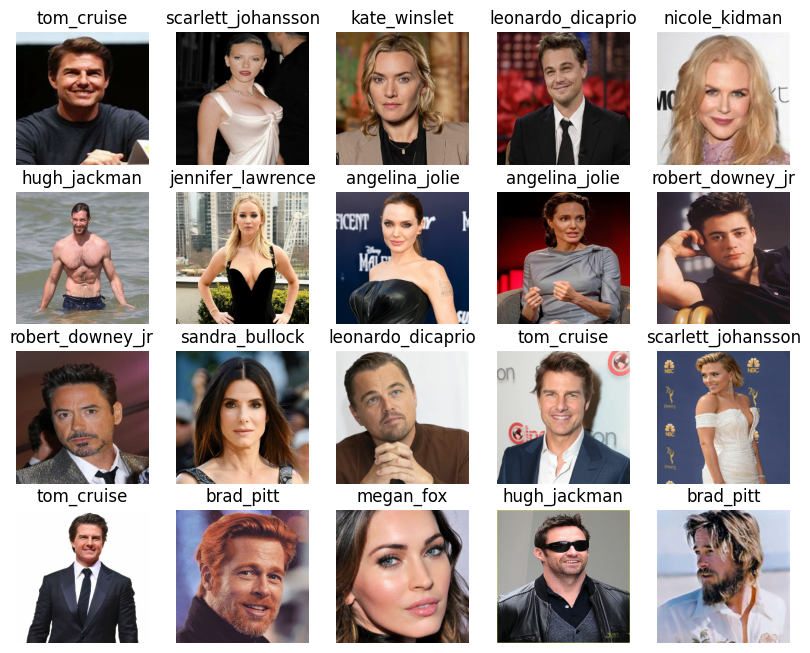

In [45]:
#visualizing training set
show_20_image(train_images,train_labels)

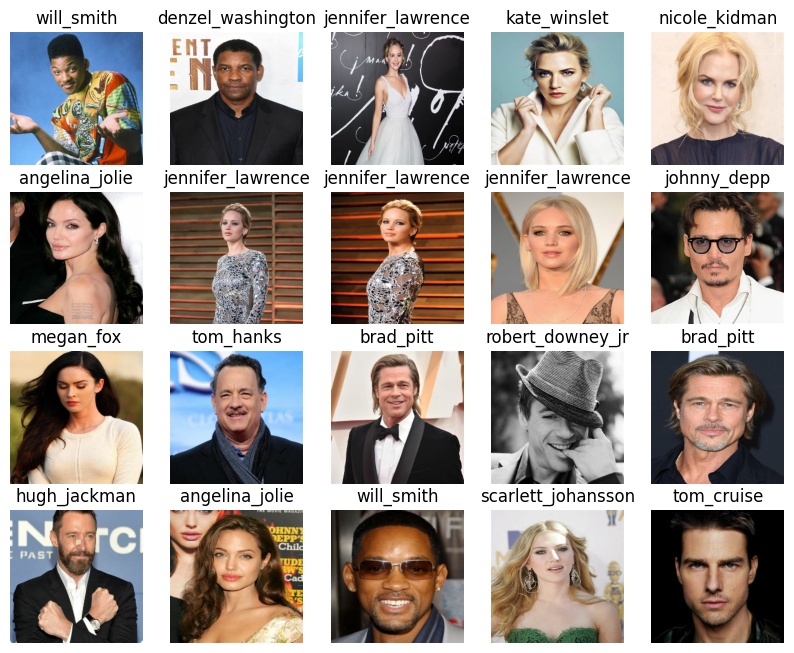

In [46]:
val_images,val_labels=next(val_data.as_numpy_iterator())
show_20_image(val_images,val_labels)

In [47]:
len(unique_celeb)

17

In [48]:
#building model
#setting up image size
INPUT_SHAPE= [None,IMG_SIZE,IMG_SIZE,3] #batch,height,width and colour channel
#setting up output shape
OUTPUT_SHAPE=len(unique_celeb)

#setting up model URL from Tensorflow hub
MODEL_URL= "https://tfhub.dev/sayakpaul/vit_r26_s32_medaug_classification/1"

In [49]:
model= celeb_detector.create_model(MODEL_URL,INPUT_SHAPE,OUTPUT_SHAPE)
model.summary()

Building the model with: https://tfhub.dev/sayakpaul/vit_r26_s32_medaug_classification/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1000)              36431912  
                                                                 
 dense (Dense)               (None, 17)                17017     
                                                                 
Total params: 36,448,929
Trainable params: 17,017
Non-trainable params: 36,431,912
_________________________________________________________________


In [50]:
 #Creating callbacks
 #loading tensorBoard extention
%load_ext tensorboard

In [51]:
import datetime

#creating a function for callback
def create_tensorboard_callback():
  logdir =os.path.join("/content/drive/MyDrive/CelebrityDataset/logs",
                       datetime.datetime.now().strftime("%Y%m%d - %H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

###Early stopping callback to stop overfitting


In [52]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=3)

###Training the model on a subset of data

In [53]:
NUM_EPOCHS=100  #@param {type:"slider",min:10,max:100,step:10}

####Creating a function to train the model

In [54]:
from ast import mod
#function to train the model
def train_model():
  tensorboard= create_tensorboard_callback()
  #fitting the model
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  return model

In [55]:
model= train_model()

Epoch 1/100
5/5 [==============================] - 50s 6s/step - loss: 4.1456 - accuracy: 0.0688 - val_loss: 3.5786 - val_accuracy: 0.1000
Epoch 2/100
5/5 [==============================] - 1s 153ms/step - loss: 3.0845 - accuracy: 0.1625 - val_loss: 3.4388 - val_accuracy: 0.0500
Epoch 3/100
5/5 [==============================] - 1s 188ms/step - loss: 2.4366 - accuracy: 0.2313 - val_loss: 3.0314 - val_accuracy: 0.0500
Epoch 4/100
5/5 [==============================] - 1s 185ms/step - loss: 1.9793 - accuracy: 0.3500 - val_loss: 2.8037 - val_accuracy: 0.1250
Epoch 5/100
5/5 [==============================] - 1s 153ms/step - loss: 1.6145 - accuracy: 0.4688 - val_loss: 2.6689 - val_accuracy: 0.1250
Epoch 6/100
5/5 [==============================] - 1s 187ms/step - loss: 1.4097 - accuracy: 0.5375 - val_loss: 2.6233 - val_accuracy: 0.1000
Epoch 7/100
5/5 [==============================] - 1s 169ms/step - loss: 1.1962 - accuracy: 0.6625 - val_loss: 2.4645 - val_accuracy: 0.1750
Epoch 8/100
5/5

###Checking the tensorboard log and visualizing it

In [56]:
%tensorboard --logdir /content/drive/MyDrive/CelebrityDataset/logs

<IPython.core.display.Javascript object>

###Making and predicting value on our trained model

In [57]:
predictions = model.predict(val_data,verbose=1)
predictions

2/2 [==============================] - 2s 118ms/step


array([[4.02387464e-04, 1.29097234e-02, 4.98280436e-01, 6.08423084e-04,
        4.95104796e-05, 3.32659297e-03, 8.19433117e-05, 7.08833262e-02,
        8.64315552e-06, 2.46815719e-02, 3.27450362e-05, 5.13438173e-02,
        4.47810889e-04, 4.11626883e-03, 3.11840028e-01, 1.30512509e-02,
        7.93538243e-03],
       [1.63054850e-03, 1.43785551e-01, 3.09842914e-01, 5.27713783e-02,
        2.75300845e-05, 3.08005624e-02, 2.88852560e-03, 4.56868578e-03,
        1.73949299e-03, 4.44129633e-04, 4.52177250e-04, 2.91968193e-02,
        2.47430638e-03, 3.45857203e-04, 5.72960749e-02, 3.66242155e-02,
        3.25111210e-01],
       [7.40304068e-02, 5.20916516e-03, 6.76883268e-04, 3.65698070e-05,
        1.54670309e-02, 4.07887892e-05, 6.77359523e-03, 5.90582890e-03,
        2.68073496e-03, 4.17208597e-02, 3.69655676e-02, 8.89916846e-04,
        1.39414659e-02, 7.94239998e-01, 6.41459366e-04, 4.09166765e-04,
        3.70549475e-04],
       [1.73211902e-01, 1.75925829e-02, 8.26780102e-04, 2.329

In [58]:
predictions.shape

(40, 17)

In [59]:
len(y_val)

40

In [60]:
len(unique_celeb)

17

In [61]:
np.sum(predictions[0])

0.9999999

In [62]:
###Converting the array of prediction probability to their respective labels
def get_pred_label(prediction_probability):
  return unique_celeb[np.argmax(prediction_probability)]


In [63]:
#unbatch function
#creating a function to unbatch the data
def unbatch_data(data):
  images=[]
  labels=[]
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_celeb[np.argmax(label)])
  return images,labels

val_images,val_labels= unbatch_data(val_data)

In [64]:

get_pred_label(val_labels[0])


'angelina_jolie'

In [65]:
#creating a function to visualize
def plot_pred(prediction_probability,labels,images,n=1):
  pred_prob, true_label, image = prediction_probability[n], labels[n], images[n]
  #getting pred_label
  pred_label= get_pred_label(pred_prob)

  #plotting the image
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #changing the colour: green for correct prediction and red for wrong prediction
  if pred_label == true_label:
    color="green"
  else:
    color="red"

  #changing the plot title
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)



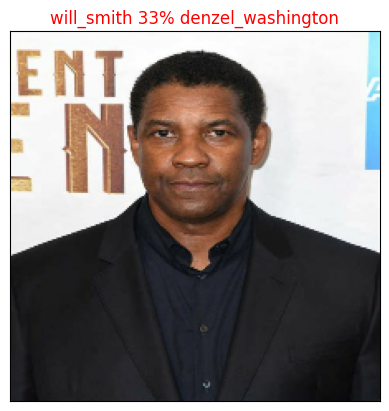

In [66]:
plot_pred(prediction_probability=predictions,
          labels=val_labels,
          images= val_images)

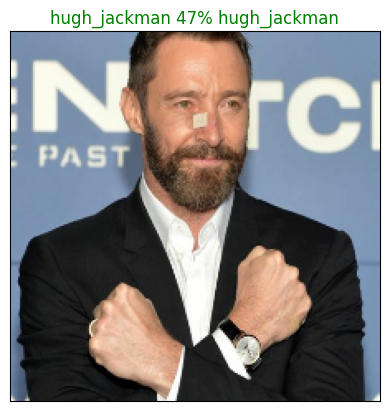

In [67]:
plot_pred(prediction_probability=predictions,
          labels=val_labels,
          images= val_images,n=15)

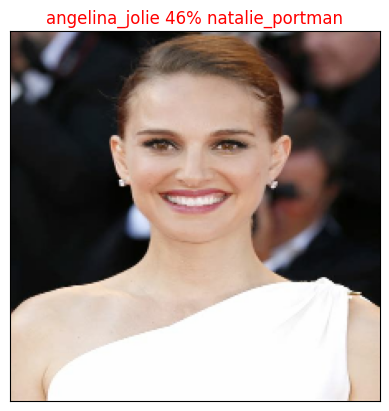

In [68]:
plot_pred(prediction_probability=predictions,
          labels=val_labels,
          images= val_images,n=35)

In [69]:
#function to visualize our model's top 10 prediction
def plot_pred_conf(prediction_probability, labels, n=1):
  pred_prob, true_label= prediction_probability[n], labels[n]

  # Get the predicted label
  pred_label= get_pred_label(pred_prob)

  #finding the top ten prediction
  top_10_pred_indexes= pred_prob.argsort()[-10:][::-1]
  #top 10 confidence
  top_10_pred_values= pred_prob[top_10_pred_indexes]
  #top 10 prediction labels
  top_10_pred_labels= unique_celeb[top_10_pred_indexes]

  #setup plot
  top_plot= plt.bar(np.arange(len(top_10_pred_labels)),
                    top_10_pred_values,
                    color="grey")

  plt.xticks(np.arange(len(top_10_pred_labels)),
                        labels= top_10_pred_labels,
                        rotation='vertical')

  #changing the color for corret and incorrect predictions
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass


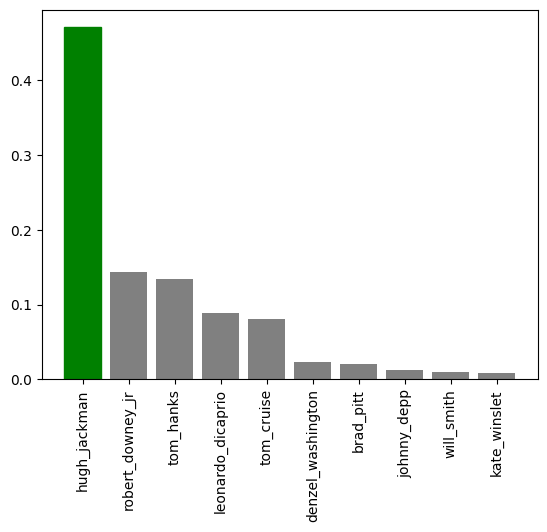

In [70]:
plot_pred_conf(prediction_probability=predictions,
               labels= val_labels,
               n=15)

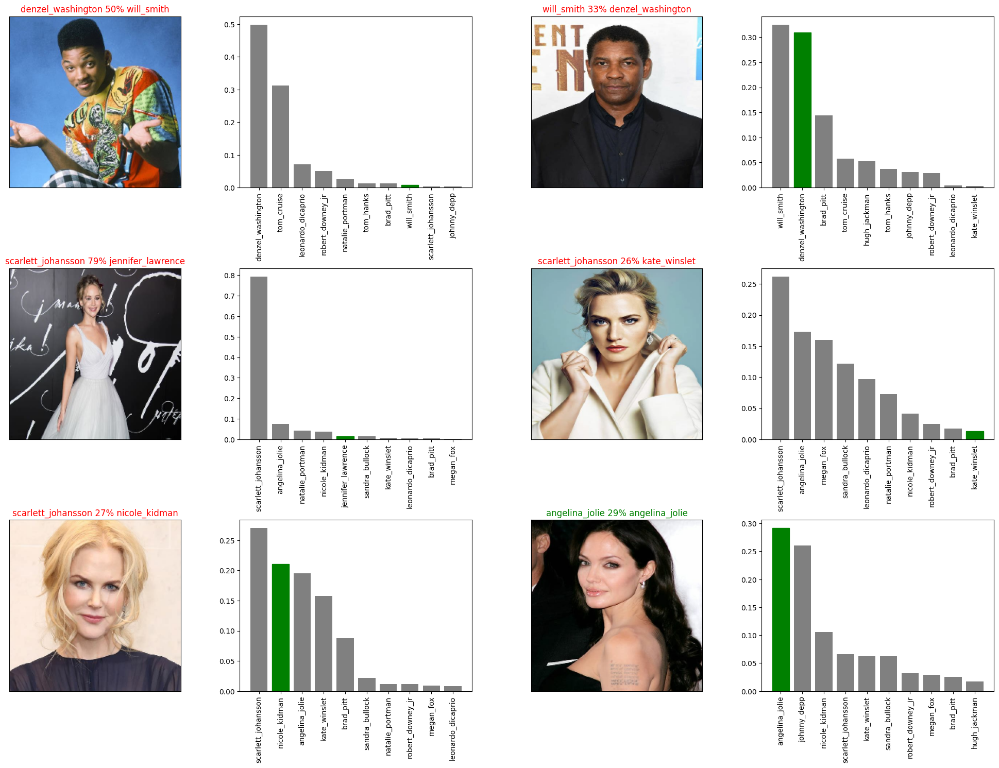

In [71]:
#checking out few of the predictions and their different values
i_multiplier =0
num_rows=3
num_cols=2
num_images= num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probability=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probability=predictions,
            labels=val_labels,
            n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [72]:
#saving and reloading our model
# def save_model(model,suffix="celeb-face-vision-transformer"):
#   modeldir = os.path.join("/content/drive/MyDrive/CelebrityDataset/models",
#                           datetime.datetime.now().strftime("%Y%m%d - %H%M%s"))
#   model_path= modeldir+"-"+suffix+".h5"
#   print(f"saving model to: {model_path}")
#   model.save(model_path)
#   return model_path


In [73]:
# def load_model(model_path):
#   print(f"loading the model from {model_path}")
#   model= tf.keras.models.load_model(model_path,
#                                     custom_objects={"KerasLayer":hub.KerasLayer})
#   return model

In [74]:
# save_model(model)

In [75]:
# loaded = load_model("/content/drive/MyDrive/CelebrityDataset/models/20230808 - 04381691469533-celeb-face-vision-transformer.tf")

In [76]:
full_data= create_data_batches(X,y)

In [77]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 17), dtype=tf.bool, name=None))>

In [78]:
full_model= celeb_detector.create_model(MODEL_URL,INPUT_SHAPE,OUTPUT_SHAPE)

Building the model with: https://tfhub.dev/sayakpaul/vit_r26_s32_medaug_classification/1


In [79]:
full_model_tensorboard= create_tensorboard_callback()
full_model_early_stopping= tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                            patience=3)

In [80]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
43/43 [==============================] - 33s 470ms/step - loss: 2.6062 - accuracy: 0.2184
Epoch 2/100
43/43 [==============================] - 6s 130ms/step - loss: 1.6278 - accuracy: 0.4529
Epoch 3/100
43/43 [==============================] - 5s 105ms/step - loss: 1.3300 - accuracy: 0.5463
Epoch 4/100
43/43 [==============================] - 6s 141ms/step - loss: 1.1169 - accuracy: 0.6265
Epoch 5/100
43/43 [==============================] - 6s 131ms/step - loss: 1.0094 - accuracy: 0.6772
Epoch 6/100
43/43 [==============================] - 5s 104ms/step - loss: 0.8956 - accuracy: 0.7125
Epoch 7/100
43/43 [==============================] - 6s 131ms/step - loss: 0.8342 - accuracy: 0.7287
Epoch 8/100
43/43 [==============================] - 5s 105ms/step - loss: 0.7638 - accuracy: 0.7507
Epoch 9/100
43/43 [==============================] - 6s 141ms/step - loss: 0.7074 - accuracy: 0.7772
Epoch 10/100
43/43 [==============================] - 5s 105ms/step - loss: 0.6670 - accur

In [81]:

test_path= "/content/drive/MyDrive/CelebrityDataset/test/"
test_filename= [test_path + fname for fname in os.listdir(test_path)]
test_filename[:5]

['/content/drive/MyDrive/CelebrityDataset/test/e573a51e-9518-4c00-998d-b469d4c0bac6.jpg',
 '/content/drive/MyDrive/CelebrityDataset/test/aef95555-7736-4b72-8456-9e250ba18c58.jpg',
 '/content/drive/MyDrive/CelebrityDataset/test/146c46e9-f161-4828-966b-28527510e638.jpg',
 '/content/drive/MyDrive/CelebrityDataset/test/f1b3eb2b-00a6-4472-ae65-41e1590fbf9d.jpg',
 '/content/drive/MyDrive/CelebrityDataset/test/1964c766-54d1-491c-8e24-bafa7bd82500.jpg']

In [83]:
#creating test data batches
test_data= create_data_batches(test_filename,test_data=True)

In [84]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [85]:
#making predictions on test data
test_predictions= full_model.predict(test_data,verbose=1)

14/14 [==============================] - 115s 8s/step


In [86]:
test_predictions.shape

(440, 17)

In [87]:
test_pred_labels= [get_pred_label(test_predictions[i]) for i in range(len(test_predictions))]
test_pred_labels

['jennifer_lawrence',
 'jennifer_lawrence',
 'scarlett_johansson',
 'jennifer_lawrence',
 'kate_winslet',
 'kate_winslet',
 'nicole_kidman',
 'angelina_jolie',
 'jennifer_lawrence',
 'jennifer_lawrence',
 'nicole_kidman',
 'jennifer_lawrence',
 'kate_winslet',
 'jennifer_lawrence',
 'jennifer_lawrence',
 'natalie_portman',
 'kate_winslet',
 'jennifer_lawrence',
 'scarlett_johansson',
 'jennifer_lawrence',
 'natalie_portman',
 'nicole_kidman',
 'nicole_kidman',
 'hugh_jackman',
 'nicole_kidman',
 'nicole_kidman',
 'jennifer_lawrence',
 'nicole_kidman',
 'angelina_jolie',
 'jennifer_lawrence',
 'sandra_bullock',
 'kate_winslet',
 'nicole_kidman',
 'nicole_kidman',
 'scarlett_johansson',
 'kate_winslet',
 'nicole_kidman',
 'kate_winslet',
 'scarlett_johansson',
 'kate_winslet',
 'kate_winslet',
 'nicole_kidman',
 'natalie_portman',
 'scarlett_johansson',
 'jennifer_lawrence',
 'angelina_jolie',
 'kate_winslet',
 'natalie_portman',
 'sandra_bullock',
 'angelina_jolie',
 'jennifer_lawrence'

In [88]:
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/CustomImages/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [90]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)

In [91]:
# Make predictions on the custom data
custom_preds = full_model.predict(custom_data)

1/1 [==============================] - 15s 15s/step


In [92]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['tom_cruise', 'brad_pitt', 'angelina_jolie']

In [93]:
# Get custom images (our unbatch() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

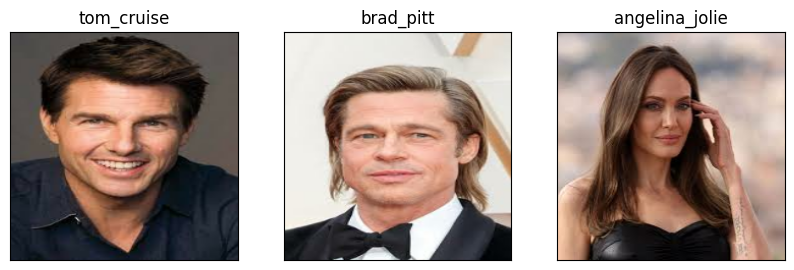

In [94]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)